In [2]:
import os
from sklearn.model_selection import StratifiedKFold, train_test_split
from torch.utils.data import TensorDataset, DataLoader
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
from albumentations.pytorch import ToTensorV2
from six.moves import xrange
import random
import umap
import cv2 as cv
import natsort
from tqdm import tqdm
from prefetch_generator import BackgroundGenerator
import utils_test
from skimage.transform import resize
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import read_data

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import pandas as pd
from sklearn.model_selection import StratifiedKFold,ShuffleSplit,KFold
import nibabel as nib
import pickle
import copy
import preprocessing
import utils
import nets_LV
from collections import namedtuple
from utils import img_extended
import albumentations as A
from sklearn import metrics
import itertools

import math                                 

In [3]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
torch.cuda.empty_cache()

In [4]:
my_whole_seed = 42
torch.manual_seed(my_whole_seed)
torch.cuda.manual_seed_all(my_whole_seed)
torch.cuda.manual_seed(my_whole_seed)
np.random.seed(my_whole_seed)
random.seed(my_whole_seed)

In [5]:
idx_to_label = {0: 'non-DR', 1: 'NPDR', 2: 'PDR'}


def getKey(item):
    for idx, label in idx_to_label.items():
        if label == item:
            return idx

        

def getValue(key):
    for idx, label in idx_to_label.items():
        if idx == key:
            return label


In [6]:
transform_shape = A.Compose([
    A.HorizontalFlip(),
    A.RandomResizedCrop(
        height = 512,width=512, scale=(0.80, 1)),
    A.Rotate(limit=5),
    A.RandomBrightnessContrast(brightness_limit=.10, contrast_limit=.10),
    A.GaussNoise(var_limit=.0001, )
    ])


In [7]:
import albumentations as albu

def get_training_augmentation():
    train_transform = [

        albu.HorizontalFlip(p=0.5),

#         albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=(-20,20), shift_limit=0.1, p=1, border_mode=0),


        albu.PadIfNeeded(min_height=512, min_width=512, always_apply=True, border_mode=0),
        albu.RandomResizedCrop(height=512, width=512, scale=(0.80, 1), always_apply=True),

        albu.GaussNoise(p=0.2),
        albu.Perspective(p=0.5),


        # albu.RandomBrightness(limit=0.4),
        # albu.RandomContrast(limit=0.4),


        albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightnessContrast(p=1),
                albu.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        albu.OneOf(
            [
#                 albu.IAASharpen(p=1),
                albu.Blur(blur_limit=3, p=1),
                albu.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

#         albu.OneOf(
#             [
#                 albu.RandomContrast(p=1),
#                 albu.HueSaturationValue(p=1),
#             ],
#             p=0.9,
#         ),
    ]
    return albu.Compose(train_transform)

In [8]:
def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        albu.Resize(512,512)
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


In [9]:
class anomalyDetectionB5(Dataset):
    def __init__(self, images,labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform


    def __len__(self):
        return self.images.shape[0]

    def __getitem__(self, idx):
        image = self.images[idx]
        image = (image).astype('uint8')
        label = self.labels[idx]

#         image = image/255
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        return (image/255), label

In [10]:
params = {
    "device": "cuda",
    "lr": 0.001,
    "batch_size": 4,
    "num_workers": 4,
    "epochs": 200,
}


In [10]:



data =[]
label = []
filenames = []
ctlist=os.listdir('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_enface_merged')
ctlist=natsort.natsorted(ctlist)
# read labels from the excel file
dfs_classification = pd.read_csv('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/2. Groundtruths/a. DRAC2022_ Diabetic Retinopathy Grading_Training Labels.csv')
dfs_quality = pd.read_csv('/home/hana/optima/exchange/hjebril/challenge/B. Image Quality Assessment/2. Groundtruths/a. DRAC2022_ Image Quality Assessment_Training Labels.csv')

for idx, filename in enumerate(ctlist):
    x_classification = dfs_classification.loc[dfs_classification['image name'] == filename]['DR grade'].values
    x_qulity = dfs_quality.loc[dfs_quality['image name'] == filename]['image quality level'].values
#     if(x_classification[0] == 0):
    if(x_qulity[0] == 2):
        image = imread('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_enface_merged/'+filename)
#         image = cv.resize(image, (512, 512))
        if(image.shape[0]>608):
            image = cv.resize(image, (608, 608))
        data.append(image)
        label.append(x_classification[0])
        filenames.append(filename)


In [11]:
data = np.asarray(data)
label = np.asarray(label)
filenames = np.asarray(filenames)

In [12]:
normal_data= data[np.where(label == 0)[0]]
anomolous_data= data[np.where(label != 0)[0]]
normal_label = label[np.where(label == 0)[0]]
anomolous_label = label[np.where(label != 0)[0]]
normal_filenames = filenames[np.where(label == 0)[0]]
anomolous_filenames = filenames[np.where(label != 0)[0]]
roc_list = []
kfold2 = ShuffleSplit(n_splits=7, random_state=0, train_size=0.93)
for train_ix, test_ix in kfold2.split(normal_data,normal_label):
    # select rows
    X_train, X_rem = normal_data[train_ix], normal_data[test_ix]
    y_train, y_rem = normal_label[train_ix], normal_label[test_ix]
    filenames_train, filenames_rem = normal_filenames[train_ix], normal_filenames[test_ix]
    kfold1 = ShuffleSplit(n_splits=6, random_state=0, test_size=0.5)
    for valid_ix, test_ix in kfold1.split(X_rem,y_rem):
        # select rows
        X_valid1, X_test1 = X_rem[valid_ix], X_rem[test_ix]
        y_valid1, y_test1 = y_rem[valid_ix], y_rem[test_ix]
        filenames_valid1, filenames_test1 = filenames_rem[valid_ix], filenames_rem[test_ix] 
        kf = StratifiedKFold(n_splits=2, shuffle=True)
        for train_idx, test_idx in kf.split(anomolous_data,anomolous_label):
            X_test2, X_valid2 = anomolous_data[train_idx], anomolous_data[test_idx]
            y_test2, y_valid2 = anomolous_label[train_idx], anomolous_label[test_idx]
            filenames_test2, filenames_valid2 = anomolous_filenames[train_idx], anomolous_filenames[test_idx]
            X_valid = np.concatenate((X_valid2, X_valid1), axis=0)
            X_test = np.concatenate((X_test2, X_test1), axis=0)
            y_valid = np.concatenate((y_valid2, y_valid1), axis=0)
            y_test = np.concatenate((y_test2, y_test1), axis=0)    
            filenames_valid = np.concatenate((filenames_valid2, filenames_valid1), axis=0)
            filenames_test = np.concatenate((filenames_test2, filenames_test1), axis=0)  

In [13]:
train_dataset = anomalyDetectionB5(images=X_train,labels = y_train, transform=get_training_augmentation())
valid_dataset = anomalyDetectionB5(images=X_valid,labels = y_valid, transform=get_validation_augmentation())
test_dataset = anomalyDetectionB5(images=X_test,labels = y_test, transform=get_validation_augmentation())

train_loader = DataLoader(
    train_dataset, batch_size=params["batch_size"], shuffle=True, num_workers=params["num_workers"], pin_memory=True,
)
val_loader = DataLoader(
    valid_dataset, batch_size=1, shuffle=False , num_workers=params["num_workers"], pin_memory=True,
)
test_loader = DataLoader(
    test_dataset, batch_size=1, shuffle=False , num_workers=params["num_workers"], pin_memory=True,
)
device = torch.device(params["device"])


In [14]:
import cv2
def visualize_augmentations(dataset, idx=0, samples=5, cols=5):
    dataset2 = copy.deepcopy(dataset)
    dataset2.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
#     rows = samples // cols
    figure, ax = plt.subplots(nrows=2, ncols=cols, figsize=(12, 6))
    for i in range(samples):
        image = X_train[i]
        image2, _ = dataset2[i]
        ax[0,i].imshow(image, cmap=plt.cm.gray)
        ax[0,i].set_axis_off()
        ax[0,i].set_title('Original')
        ax[1,i].imshow(image2, cmap=plt.cm.gray)
        ax[1,i].set_title('Augmented')
        ax[1,i].set_axis_off()
        
    plt.tight_layout()
    plt.show()

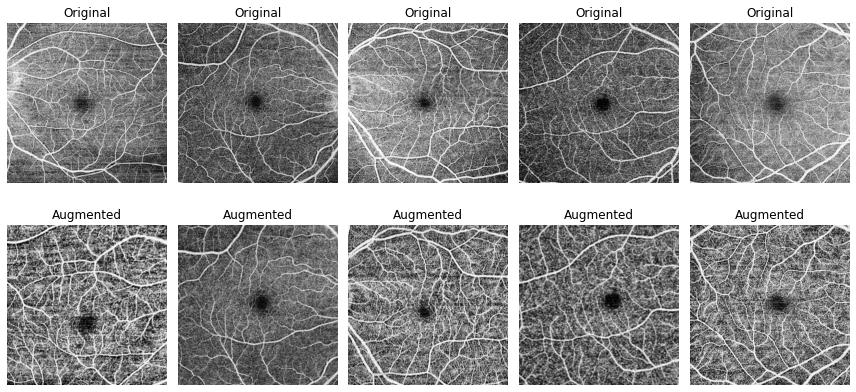

In [15]:
visualize_augmentations(train_dataset)

## VQVAE+AR

In [14]:



feat_ext_mdl = nets_LV.VQVAE(1,n_channels=(16,32,64,128),code_size=128,n_res_block=2, dropout_p=.1)
device= "cuda"
feat_ext_mdl.to(device)
chpt = torch.load('saved_model/vqvae_200.pt')
feat_ext_mdl.load_state_dict(chpt['model'])


model = nets_LV.VQLatentSNAIL(feature_extractor_model=feat_ext_mdl,
                              shape=(64,64), n_block = 4, n_res_block = 4, n_channels = 128)
model.to(device)
chpt = torch.load('saved_model/AR_300.pt')
model.load_state_dict(chpt['model'])

<All keys matched successfully>

In [15]:
def evaluate_vqvae(net,dataloader,device,nb_forward=15):
    net.eval()
    losses = torch.empty((0,64,64))
    probs_list = []
    # iterate over the validation set
    # for batch in tqdm(dataloader, total=num_val_batches, desc='Validation round', unit='batch', leave=False):
    pbar = tqdm(enumerate(BackgroundGenerator(dataloader)), total=len(dataloader))
    for itr, (test_images, test_annotations) in pbar:
        x = test_images
        # move images and labels to correct device and type
        x = x.to(device=device, dtype=torch.float32)

        # iterate over the forward passes
#         for f_pass in range(nb_forward):
        with torch.no_grad():
            # predict the mask (pytorch tensor have the following structure : [batch_no, class, pixel_x, pixel_y])
#             codes = net.retrieve_codes(x)
#             logits = model.forward_latent(codes)
            # take probability
#             probs = F.softmax(logits, dim=1)
#             loss1 = F.cross_entropy(logits, codes, reduction='none')
#             probs = F.softmax(loss1, dim=1)
            result = net.loss(x, reduction='none')
            loss = result['loss']
            probs = F.softmax(loss, dim=1)
            losses = torch.cat((losses,loss.cpu()),dim=0)
              # upscale loss
            up_scl = 8
            upscale_loss = np.kron(loss.cpu().numpy()[0], np.ones((up_scl,up_scl)))
            probs_list.append(upscale_loss)
#                 plt.imshow(result['x_tilde'].cpu().numpy()[0][0])
#                 plt.show()
#                 cv2.imwrite(os.path.join(test_results_visulaize, cubename[0]),mask_pred_softmax[0,1].cpu().detach().numpy()*255)
    return np.array(probs_list)




In [18]:
losses = evaluate_vqvae(model,val_loader,device,nb_forward=15)

100%|██████████| 129/129 [00:07<00:00, 18.29it/s]


In [19]:
losses.shape

(129, 512, 512)

In [20]:
losses_test = evaluate_vqvae(model,test_loader,device,nb_forward=15)

100%|██████████| 130/130 [00:06<00:00, 18.67it/s]


In [21]:
perces = []
perces.append(np.percentile(losses, 99))
perces.append(np.percentile(losses, 98))
perces.append(np.percentile(losses, 97))
perces.append(np.percentile(losses, 96))
perces.append(np.percentile(losses, 95))
perces.append(np.percentile(losses, 94))
perces.append(np.percentile(losses, 93))
perces.append(np.percentile(losses, 92))
perces.append(np.percentile(losses, 91))
perces.append(np.percentile(losses, 90))
perces.append(np.percentile(losses, 89))
perces.append(np.percentile(losses, 88))


In [22]:
losses.max()

19.298778533935547

In [23]:
perces

[7.2128400802612305,
 6.672815322875977,
 6.364498138427734,
 6.14257287979126,
 5.976009368896484,
 5.838268280029297,
 5.719380855560303,
 5.6188530921936035,
 5.5279741287231445,
 5.447995662689209,
 5.375791549682617,
 5.308166980743408]

In [24]:

def sample_loss(model,mood_test,y_valid,device, thresh):
    pred = []
    model.eval()
    for X in mood_test:
        x_img = X.to(device).float()
        with torch.no_grad():
            codes = model.retrieve_codes(x_img).flatten(1)
            loss = model.loss(x_img, reduction='none')['loss'].flatten(1)
            score1 = torch.sum(loss*(loss>thresh),1).float()
            pred.append([score1.cpu().numpy()])
    pred = np.concatenate(pred,1).reshape(-1,1)
    
    avg =[]
    classes = idx_to_label.values()
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
    avg.append(np.ravel(normal_loss).tolist())
    cnv_loss = pred[np.where(y_valid == 1)[0]]
    cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
    avg.append(np.ravel(cnv_loss).tolist())
    dr_loss = pred[np.where(y_valid == 2)[0]]
    dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
    avg.append(np.ravel(dr_loss).tolist())
#     amd_loss = pred[np.where(y_valid == 3)[0]]
#     amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
#     avg.append(np.ravel(amd_loss).tolist())
    plt.figure(figsize=(9, 7))
    plt.boxplot(avg,labels=classes)
    plt.xlabel("Classes")
    plt.ylabel("Loss value")
    plt.title("Loss per class-validation")
    plt.show()
    
    
    y_test_2 = np.where(y_valid > 0, 1, 0)
    fpr, tpr, thresholds = metrics.roc_curve(y_test_2, pred)
    roc_auc_all = metrics.auc(fpr, tpr)
    
    
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, Unhealthy) validation")
    plt.legend(loc="lower right")
    plt.show()
    
    
    
#     normal_loss = pred[np.where(y_valid == 0)[0]]
#     normal_label = y_valid[np.where(y_valid == 0)[0]]

#     amd_loss = pred[np.where(y_valid == 3)[0]]
#     amd_label = y_valid[np.where(y_valid == 3)[0]]

#     loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

#     X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
#     X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
#     print(X_test_nor)
#     fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
#     roc_auc = metrics.auc(fpr, tpr)
#     plt.figure()
#     lw = 2
#     plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
#     plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel("False Positive Rate")
#     plt.ylabel("True Positive Rate")
#     plt.title("ROC (Healty, AMD) - validation")
#     plt.legend(loc="lower right")
#     plt.show()
    
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_label = y_valid[np.where(y_valid == 0)[0]]

    amd_loss = pred[np.where(y_valid == 2)[0]]
    amd_label = y_valid[np.where(y_valid == 2)[0]]

    loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

    X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
    X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
    fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
    roc_auc = metrics.auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, DR) - validation")
    plt.legend(loc="lower right")
    plt.show()
    
    
    
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_label = y_valid[np.where(y_valid == 0)[0]]

    amd_loss = pred[np.where(y_valid == 1)[0]]
    amd_label = y_valid[np.where(y_valid == 1)[0]]

    loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

    X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
    X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
    fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
    roc_auc = metrics.auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, CNV) - validation")
    plt.legend(loc="lower right")
    plt.show()
    return roc_auc_all,pred

In [25]:
perces.append(0)

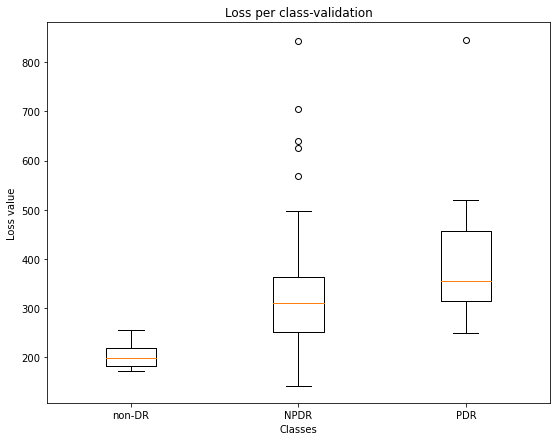

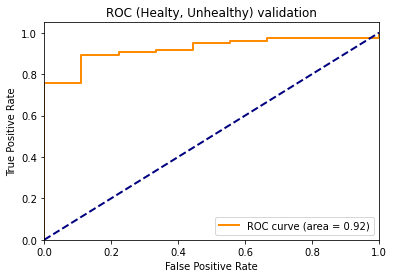

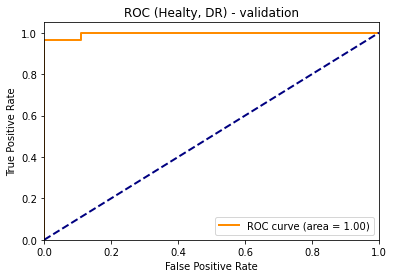

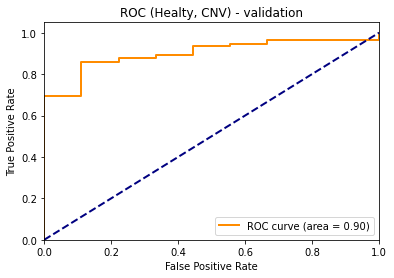

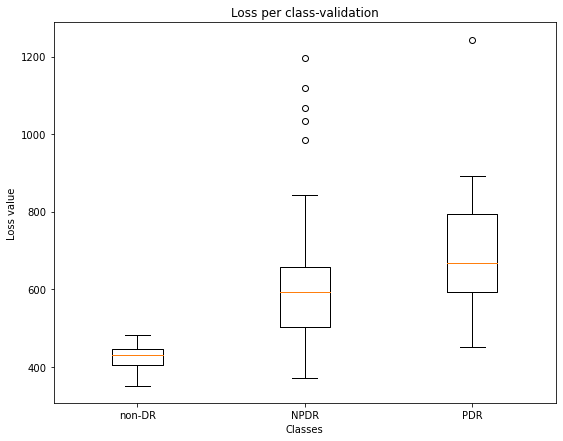

...

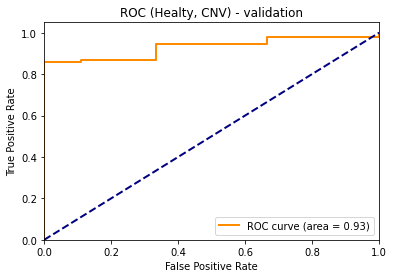

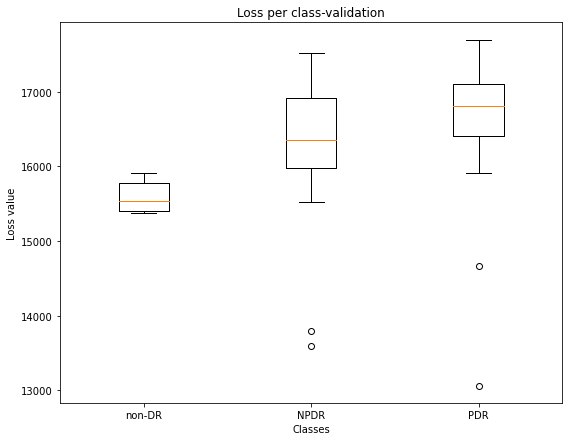

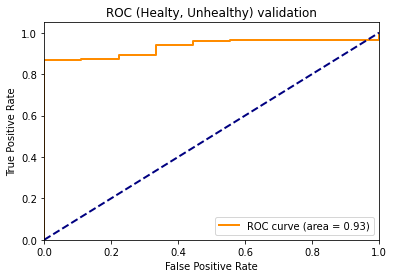

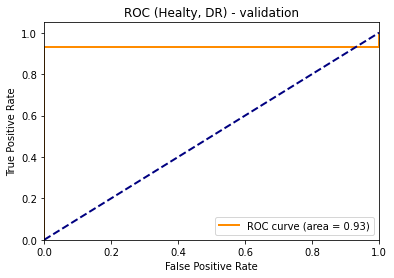

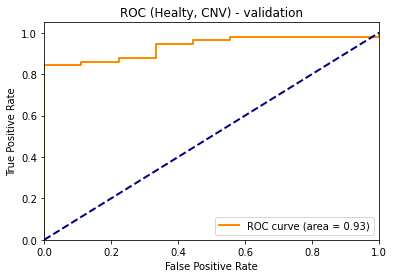

In [26]:
thresholds = []
roc_all = []
perces2 = [0]
model.eval()
# x = torch.from_numpy(X_valid.copy()).to("cuda").float()
with torch.no_grad():
#     codes = model.retrieve_codes(x/255)
#     loss = model.loss(x/255, reduction='none')['loss']
    
    mood_test = []
    label_test = []
    for img, label in val_loader:
        mood_test.append(img)
        label_test.append(label.item())
    
    label_test = np.array(label_test)
    for percentile in perces:
        roc,pp = sample_loss(model,mood_test,label_test,device, percentile)
        thresholds.append(percentile)
        roc_all.append(roc)
        

[7.2128400802612305, 6.672815322875977, 6.364498138427734, 6.14257287979126, 5.976009368896484, 5.838268280029297, 5.719380855560303, 5.6188530921936035, 5.5279741287231445, 5.447995662689209, 5.375791549682617, 5.308166980743408, 0]
[0.923148148148148, 0.9361111111111111, 0.9222222222222222, 0.9351851851851852, 0.9370370370370371, 0.9342592592592593, 0.9268518518518518, 0.9148148148148147, 0.9203703703703703, 0.9305555555555556, 0.9453703703703704, 0.9407407407407407, 0.9333333333333333]


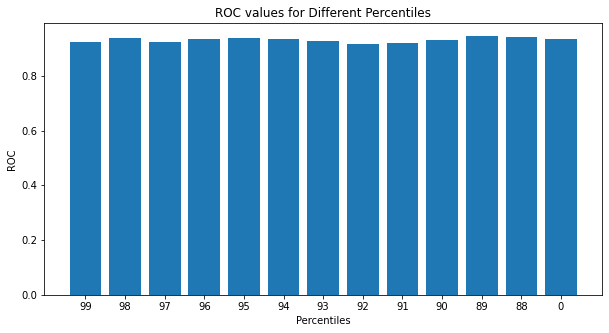

In [27]:
fig = plt.figure(figsize = (10, 5))

percentiles = ['99','98','97','96','95','94','93','92','91','90','89','88','0']

# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i], ha = 'center')
print(thresholds)      
print(roc_all)        
# creating the bar plot
plt.bar(percentiles, roc_all)
# addlabels(thresholds, roc_all)
plt.xlabel("Percentiles")
plt.ylabel("ROC")
plt.title("ROC values for Different Percentiles")
plt.show()

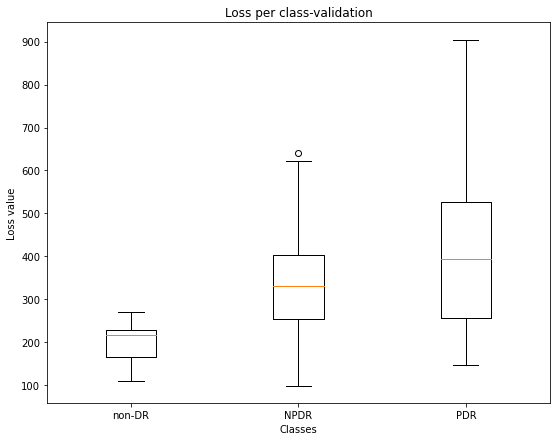

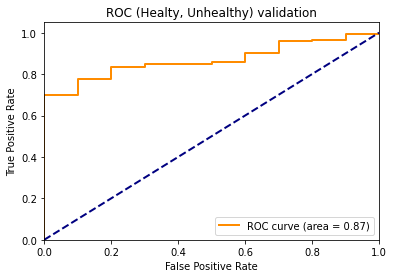

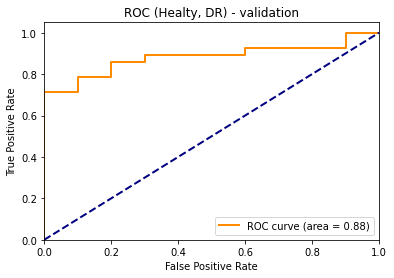

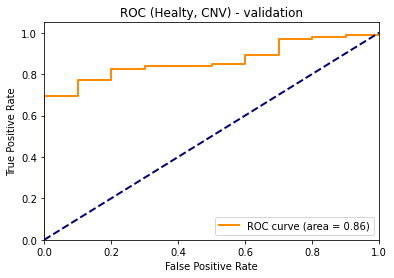

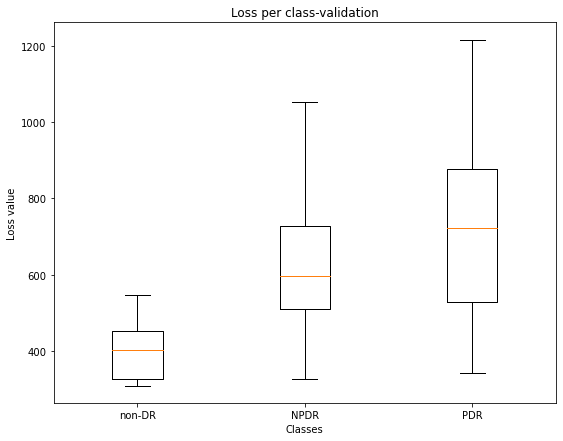

...

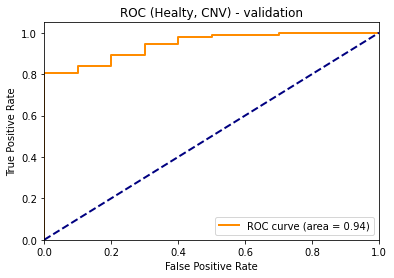

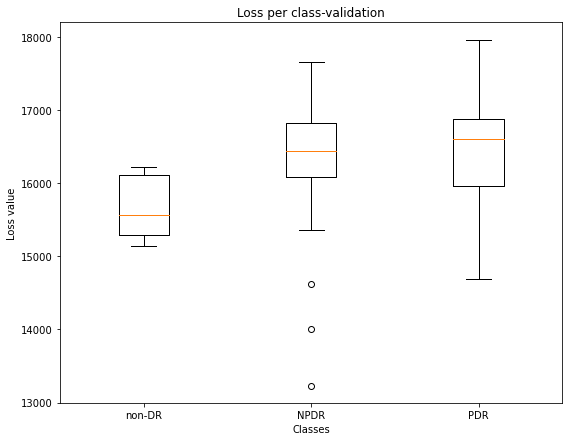

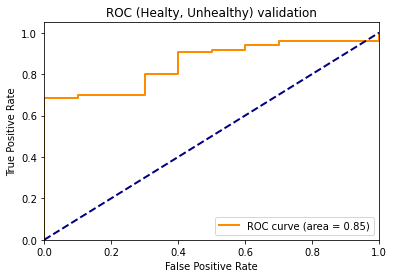

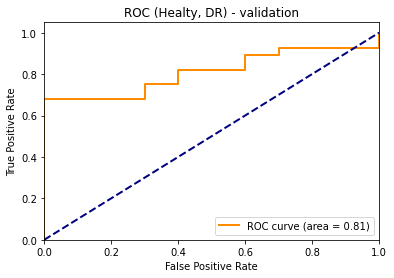

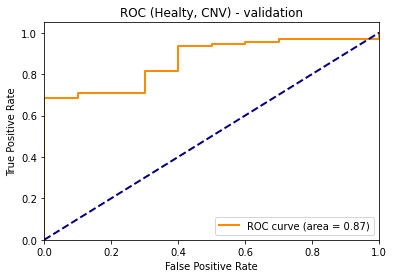

In [28]:
thresholds = []
roc_all = []
perces2 = [0]
model.eval()
# x = torch.from_numpy(X_valid.copy()).to("cuda").float()
with torch.no_grad():
#     codes = model.retrieve_codes(x/255)
#     loss = model.loss(x/255, reduction='none')['loss']
    
    mood_test = []
    label_test = []
    for img, label in test_loader:
        mood_test.append(img)
        label_test.append(label.item())
    
    label_test = np.array(label_test)
    for percentile in perces:
        roc,pp = sample_loss(model,mood_test,label_test,device, percentile)
        thresholds.append(percentile)
        roc_all.append(roc)

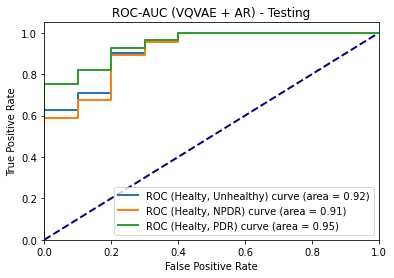

In [45]:


from sklearn import metrics
with torch.no_grad():
#     codes = model.retrieve_codes(x/255)
#     loss = model.loss(x/255, reduction='none')['loss']
    
    mood_test = []
    label_test = []
    for img, label in test_loader:
        mood_test.append(img)
        label_test.append(label.item())
    
    label_test = np.array(label_test)
    
    
thresh = 6 
pred = []
model.eval()
for X in mood_test:
    x_img = X.to(device).float()
    with torch.no_grad():
        codes = model.retrieve_codes(x_img).flatten(1)
        loss = model.loss(x_img, reduction='none')['loss'].flatten(1)
        score1 = torch.sum(loss*(loss>thresh),1).float()
        pred.append([score1.cpu().numpy()])
pred = np.concatenate(pred,1).reshape(-1,1)


plt.figure(0).clf()

y_test_2 = np.where(y_test > 0, 1, y_test)
fpr, tpr, thresholds = metrics.roc_curve(y_test_2, pred)
roc_auc = metrics.auc(fpr, tpr)
lw = 2
plt.plot(fpr,tpr,lw=lw,label="ROC (Healty, Unhealthy) curve (area = %0.2f)" % roc_auc,)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")

normal_loss = pred[np.where(y_test == 0)[0]]
normal_label = y_test[np.where(y_test == 0)[0]]

amd_loss = pred[np.where(y_test == 1)[0]]
amd_label = y_test[np.where(y_test == 1)[0]]

loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor)
roc_auc = metrics.auc(fpr, tpr)
lw = 2
plt.plot(fpr,tpr,lw=lw,label="ROC (Healty, NPDR) curve (area = %0.2f)" % roc_auc,)

normal_loss = pred[np.where(y_test == 0)[0]]
normal_label = y_test[np.where(y_test == 0)[0]]

amd_loss = pred[np.where(y_test == 2)[0]]
amd_label = y_test[np.where(y_test == 2)[0]]

loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor)
roc_auc = metrics.auc(fpr, tpr)
lw = 2
plt.plot(fpr,tpr,lw=lw,label="ROC (Healty, PDR) curve (area = %0.2f)" % roc_auc,)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC (VQVAE + AR) - Testing")
plt.legend(loc="lower right")
# plt.savefig('drac_roc_healthy_unhealthy_testing.pdf')
plt.show()

# print(metrics.classification_report(y_test_2, pred))

In [38]:
pred2= np.where(pred > 2100, 1, 0)

In [39]:
print(metrics.classification_report(y_test_2, pred2))

              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.97      0.97      0.97       120

    accuracy                           0.95       130
   macro avg       0.82      0.79      0.80       130
weighted avg       0.94      0.95      0.94       130



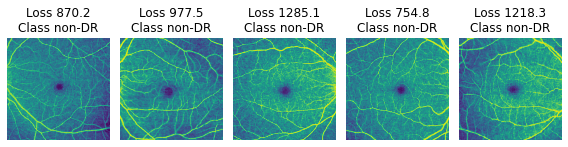

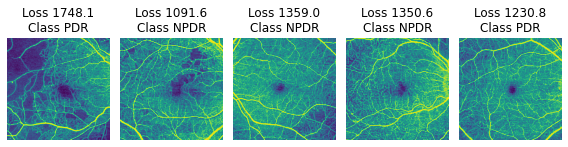

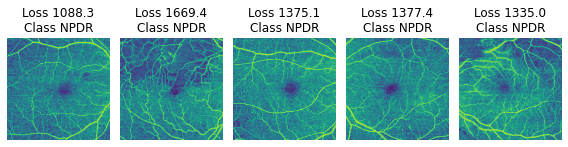

In [46]:
fig,ax = plt.subplots(1,5,figsize = (8,8))

for i,a in enumerate(ax):
    x = mood_test[i+120]
    a.imshow(x[0,:])
    a.set_title('Loss {:.1f}\nClass {}'.format(pred[i+120,0],getValue(y_test[i+120])))
    a.axis('off')
plt.tight_layout()

fig,ax = plt.subplots(1,5,figsize = (8,8))

for i,a in enumerate(ax):
    x = mood_test[i+45]
    a.imshow(x[0,:])
    a.set_title('Loss {:.1f}\nClass {}'.format(pred[i+45,0],getValue(y_test[i+45])))
    a.axis('off')
plt.tight_layout()



fig,ax = plt.subplots(1,5,figsize = (8,8))

for i,a in enumerate(ax):
    x = mood_test[i+65]
    a.imshow(x[0,:])
    a.set_title('Loss {:.1f}\nClass {}'.format(pred[i+65,0],getValue(y_test[i+65])))
    a.axis('off')
plt.tight_layout()

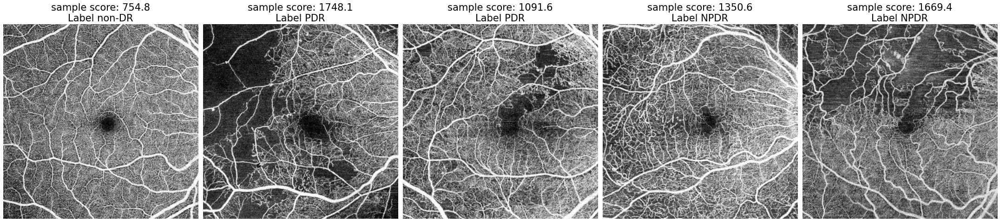

In [55]:
fig,ax = plt.subplots(1,5,figsize = (30,7))
ii = [123,45,46,48,66]
for i,a in enumerate(ax):
    idx = ii[i]
    x = mood_test[idx]
    a.imshow(x[0,:], cmap='gray')
    a.set_title('sample score: {:.1f}\nLabel {}'.format(pred[idx,0],getValue(y_valid[idx])), fontsize=21)
    a.axis('off')
plt.tight_layout()
plt.savefig('drac_sample_perlabel_examples_testing.pdf')

[7.2128400802612305, 6.672815322875977, 6.364498138427734, 6.14257287979126, 5.976009368896484, 5.838268280029297, 5.719380855560303, 5.6188530921936035, 5.5279741287231445, 5.447995662689209, 5.375791549682617, 5.308166980743408, 0]
[0.8683333333333334, 0.9033333333333333, 0.9183333333333334, 0.9208333333333333, 0.9191666666666667, 0.9308333333333334, 0.9275, 0.9266666666666666, 0.9400000000000001, 0.9483333333333334, 0.95, 0.9550000000000001, 0.8525]


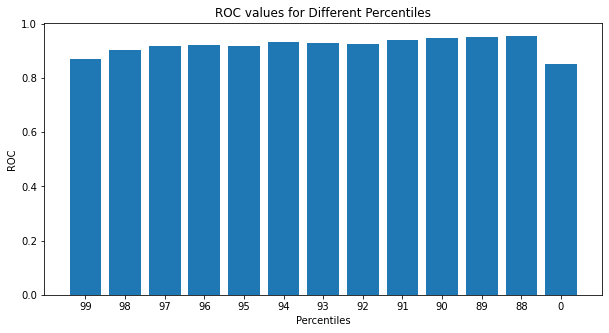

In [29]:
fig = plt.figure(figsize = (10, 5))

percentiles = ['99','98','97','96','95','94','93','92','91','90','89','88','0']

# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i], ha = 'center')
print(thresholds)      
print(roc_all)        
# creating the bar plot
plt.bar(percentiles, roc_all)
# addlabels(thresholds, roc_all)
plt.xlabel("Percentiles")
plt.ylabel("ROC")
plt.title("ROC values for Different Percentiles")
plt.show()

In [30]:


class CubeDataset_plexilite(Dataset):
    def __init__(self, dataset,data_size,is_dataaug=True):
        self.is_dataaug=is_dataaug
        # self.datanum=data_id[1]-data_id[0]
        # self.modality=modality
        self.data_size=data_size
        # self.modalitynum=len(modality)-1
        self.datasetlist={'data':{},'label':{}}
        # for modal in modality:
            # if modal != modality[-1]:
        # self.datasetlist['data'].update({modal: {}})
        imglist = os.listdir(data_dir)
        imglist = natsort.natsorted(imglist)
        self.datanum = len(imglist)
        for img in imglist:
            self.datasetlist['data'].update({img: {}})
#             imgadress= os.path.join(data_dir, img)
            self.datasetlist['data'][img] = dataset

    def __getitem__(self, index):
        data=np.zeros((1,self.data_size[0],self.data_size[1]))
#         name=list(self.datasetlist['data'])[index]
#         single_img= cv2.imread(self.datasetlist['data'][name], cv2.IMREAD_GRAYSCALE).astype(np.float32)
        data[0,:,:]  = self.datasetlist['data'][index]
#         data[0,:,:] = cv.resize(image, (512, 512))
        data = torch.from_numpy(np.ascontiguousarray(data))
        return data

    def __len__(self):
        return self.datanum

In [31]:
def enable_dropout(model):
    """ Function to enable the dropout layers during test-time """
    for m in model.modules():
        if m.__class__.__name__.startswith('Dropout'):
            m.train()
            #logging.info("activated dropout")



In [32]:
def evaluate_uncertainty(net,
                        dataloader,
                        device,
                        nb_forward):
    net.eval()
    uncertaities = []
    #Activate the dropout layers
    enable_dropout(net)
#     test_results = os.path.join(opt.saveroot, 'test_results_drac_all')
#     test_results_visulaize = os.path.join(opt.saveroot, 'drac_output_all')
    #Define the bash number
    num_val_batches = len(dataloader)

    #Initialization of scores
    dice_score = 0
    n_classes = 2
    accuracy_score = 0
    accuracy_per_class = 0
    F1_coeff_per_class  = 0
    IOU_coeff = 0 
    IOU_coeff_per_class = 0
    cf_matrix = np.zeros(shape = (n_classes,n_classes))
    pa = 0
    pu = 0
    pavpu = 0

    # iterate over the validation set
    # for batch in tqdm(dataloader, total=num_val_batches, desc='Validation round', unit='batch', leave=False):
    pbar = tqdm(enumerate(BackgroundGenerator(dataloader)), total=len(dataloader))
    for itr, (test_images, label) in pbar:
        image = test_images.unsqueeze(1)
        # move images and labels to correct device and type
        image = image.to(device=device, dtype=torch.float32)
        dropout_predictions = torch.empty((0,1,2,512, 512))
        # iterate over the forward passes
        for f_pass in range(nb_forward):
            with torch.no_grad():
                # predict the mask (pytorch tensor have the following structure : [batch_no, class, pixel_x, pixel_y])
                mask_pred = net(image)
                mask_pred_softmax = mask_pred.cpu().softmax(dim=1)
#                 cv2.imwrite(os.path.join(test_results_visulaize, cubename[0]),mask_pred_softmax[0,1].cpu().detach().numpy()*255)
                # concatenate prediction to the other made on the same batch
                dropout_predictions = torch.cat((dropout_predictions,mask_pred.cpu().softmax(dim=1).unsqueeze(dim=0)),dim=0)

                # # compute confidence matrix
                # cf_matrix = cf_matrix + confusion_matrix(mask_true.argmax(dim=1).view(-1).cpu(),mask_pred.argmax(dim=1).view(-1).cpu(), labels = np.arange(0,n_classes))
        #Compute uncertainty indicateurs
        batch_mean = dropout_predictions.mean(dim=0)
#         str=cubename[0].split('.')[0]+'.npy'
        batch_std = dropout_predictions.std(dim=0)
        batch_pred_entropy = -torch.sum(batch_mean*batch_mean.log(),dim=1)
        batch_mutual_info = batch_pred_entropy+torch.mean(torch.sum(dropout_predictions*dropout_predictions.log(),dim=-3),dim=0)
        # cv2.imwrite(os.path.join(test_results, cubename[0]),batch_mutual_info[0,:,:].cpu().detach().numpy()*255)
#         np.save(os.path.join(test_results, str), batch_mutual_info[0,:,:].cpu().detach().numpy())
        uncertaities.append(batch_mutual_info[0,:,:].cpu().detach().numpy())
    
    uncertaities_np = np.array(uncertaities)
    return uncertaities_np



In [33]:
from models.unet import UNet
from options.test_options import TestOptions



net= UNet(in_channels=1, n_classes=2, channels=128);

saveroot = 'logs'
bestmodelpath = os.path.join(saveroot, 'best_model',
                                 natsort.natsorted(os.listdir(os.path.join(saveroot, 'best_model')))[-1])
restore_path = os.path.join(saveroot, 'best_model',
                            natsort.natsorted(os.listdir(os.path.join(saveroot, 'best_model')))[-1]) + '/' + \
               os.listdir(bestmodelpath)[0]
net.load_state_dict(
    torch.load(restore_path, map_location=device)
)
#input the model into GPU
net.to(device=device)

UNet(
  (conv1): unetConv2(
    (conv1): Sequential(
      (0): Conv2d(1, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Dropout2d(p=0.1, inplace=False)
    )
    (conv2): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Dropout2d(p=0.1, inplace=False)
    )
    (conv3): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Dropout2d(p=0.1, inplace=False)
    )
  )
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): unetConv2(
    (conv1): Sequential(
      (0)

In [34]:
# from torchsummary import summary

# summary(net, (1, 512, 512))


In [35]:
uncertaities_np_valid = evaluate_uncertainty(net,val_loader,device, nb_forward=50)

100%|██████████| 129/129 [06:25<00:00,  2.99s/it]


In [36]:
uncertaities_np_test = evaluate_uncertainty(net,test_loader,device, nb_forward=50)

100%|██████████| 130/130 [06:24<00:00,  2.96s/it]


In [37]:
perces2 = []
perces2.append(np.percentile(uncertaities_np_valid, 99.5))
perces2.append(np.percentile(uncertaities_np_valid, 99))
perces2.append(np.percentile(uncertaities_np_valid, 98))
perces2.append(np.percentile(uncertaities_np_valid, 97))
perces2.append(np.percentile(uncertaities_np_valid, 96))
perces2.append(np.percentile(uncertaities_np_valid, 95))
perces2.append(np.percentile(uncertaities_np_valid, 94))
perces2.append(np.percentile(uncertaities_np_valid, 93))
perces2.append(np.percentile(uncertaities_np_valid, 92))
perces2.append(np.percentile(uncertaities_np_valid, 91))
perces2.append(np.percentile(uncertaities_np_valid, 90))
perces2.append(np.percentile(uncertaities_np_valid, 89))
perces2.append(np.percentile(uncertaities_np_valid, 88))


In [38]:
uncertaities_np_valid.max()

0.4574873

In [39]:
perces2

[0.14668898656964302,
 0.12785059958696365,
 0.10912802815437317,
 0.0977238267660141,
 0.08906960487365723,
 0.08183503150939941,
 0.07543081045150757,
 0.06950920820236206,
 0.06386417150497437,
 0.05841527134180069,
 0.053055375814437866,
 0.047787927091121674,
 0.04260404407978058]

In [40]:
losses.shape

(129, 512, 512)

In [41]:


def sample_loss_uncertain(model,mood_test,y_valid,device, thresh):
    pred = []
    model.eval()
    for X in mood_test:
        x_img = X.to(device).float()
        with torch.no_grad():
            codes = model.retrieve_codes(x_img).flatten(1)
            loss = model.loss(x_img, reduction='none')['loss'].flatten(1)
            score1 = torch.sum(loss*(loss>thresh),1).float()
            pred.append([score1.cpu().numpy()])
    pred = np.concatenate(pred,1).reshape(-1,1)
    
    avg =[]
    classes = idx_to_label.values()
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
    avg.append(np.ravel(normal_loss).tolist())
    cnv_loss = pred[np.where(y_valid == 1)[0]]
    cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
    avg.append(np.ravel(cnv_loss).tolist())
    dr_loss = pred[np.where(y_valid == 2)[0]]
    dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
    avg.append(np.ravel(dr_loss).tolist())
#     amd_loss = pred[np.where(y_valid == 3)[0]]
#     amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
#     avg.append(np.ravel(amd_loss).tolist())
    plt.figure(figsize=(9, 7))
    plt.boxplot(avg,labels=classes)
    plt.xlabel("Classes")
    plt.ylabel("Loss value")
    plt.title("Loss per class-validation")
    plt.show()
    
    
    y_test_2 = np.where(y_valid > 0, 1, 0)
    print(y_test_2.shape)
    print(y_test_2)
    print(pred.shape)
    fpr, tpr, thresholds = metrics.roc_curve(y_test_2, pred)
    roc_auc_all = metrics.auc(fpr, tpr)
    
    
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, Unhealthy) validation")
    plt.legend(loc="lower right")
    plt.show()
    
    
    
#     normal_loss = pred[np.where(y_valid == 0)[0]]
#     normal_label = y_valid[np.where(y_valid == 0)[0]]

#     amd_loss = pred[np.where(y_valid == 3)[0]]
#     amd_label = y_valid[np.where(y_valid == 3)[0]]

#     loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

#     X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
#     X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
#     print(X_test_nor)
#     fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
#     roc_auc = metrics.auc(fpr, tpr)
#     plt.figure()
#     lw = 2
#     plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
#     plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel("False Positive Rate")
#     plt.ylabel("True Positive Rate")
#     plt.title("ROC (Healty, AMD) - validation")
#     plt.legend(loc="lower right")
#     plt.show()
    
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_label = y_valid[np.where(y_valid == 0)[0]]

    amd_loss = pred[np.where(y_valid == 2)[0]]
    amd_label = y_valid[np.where(y_valid == 2)[0]]

    loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

    X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
    X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
    print(X_test_nor)
    fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
    roc_auc = metrics.auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, DR) - validation")
    plt.legend(loc="lower right")
    plt.show()
    
    
    
    normal_loss = pred[np.where(y_valid == 0)[0]]
    normal_label = y_valid[np.where(y_valid == 0)[0]]

    amd_loss = pred[np.where(y_valid == 1)[0]]
    amd_label = y_valid[np.where(y_valid == 1)[0]]

    loss_nor = np.concatenate((normal_loss, amd_loss), axis=0)

    X_test_nor = np.concatenate((normal_label, amd_label), axis=0)
    X_test_nor = np.where(X_test_nor > 0, 1, X_test_nor)
    fpr, tpr, thresholds = metrics.roc_curve(X_test_nor, loss_nor/400)
    roc_auc = metrics.auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc,)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC (Healty, CNV) - validation")
    plt.legend(loc="lower right")
    plt.show()
    return roc_auc_all,pred




In [42]:
total_all = (uncertaities_np_valid + losses)

In [43]:
total_all.max()

19.477312922477722

(129,)


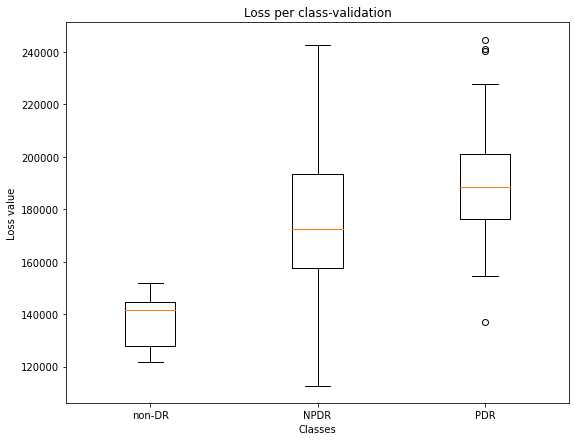

(129,)


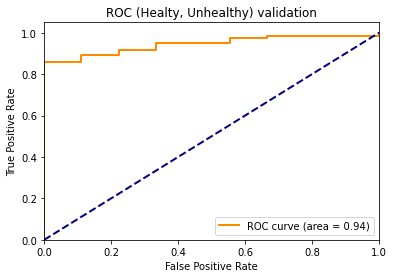

In [44]:
avg =[]
# total =  np.sum(losses*(losses > 0.16),axis = (1,2))
total = (total_all*(total_all > 5.4)).sum(axis = (1,2))
print(total.shape)
classes = idx_to_label.values()
normal_loss = total[np.where(y_valid == 0)[0]]
normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
avg.append(np.ravel(normal_loss).tolist())

cnv_loss = total[np.where(y_valid == 1)[0]]
cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
avg.append(np.ravel(cnv_loss).tolist())

dr_loss = total[np.where(y_valid == 2)[0]]
dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
avg.append(np.ravel(dr_loss).tolist())

# amd_loss = total[np.where(y_valid == 3)[0]]
# amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
# avg.append(np.ravel(amd_loss).tolist())

plt.figure(figsize=(9, 7))
plt.boxplot(avg,labels=classes)
plt.xlabel("Classes")
plt.ylabel("Loss value")
plt.title("Loss per class-validation")
plt.show()

print(y_valid.shape)
y_test_2 = np.where(y_valid > 0, 1, 0)
fpr, tpr, thresholds = metrics.roc_curve(y_test_2, total)
roc_auc_all = metrics.auc(fpr, tpr)


plt.figure()
lw = 2
plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC (Healty, Unhealthy) validation")
plt.legend(loc="lower right")
plt.show()


In [45]:
total_all_test = (uncertaities_np_test + losses_test)

(130,)


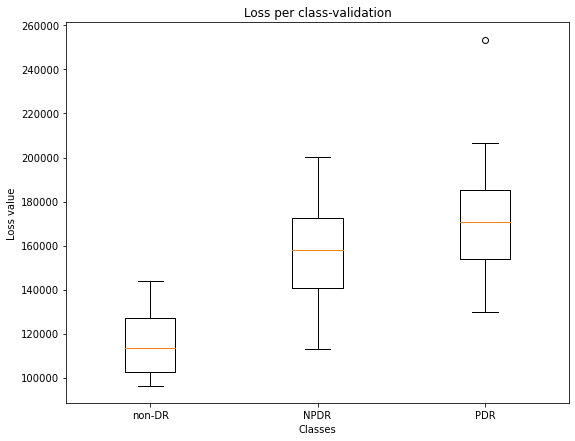

(130,)


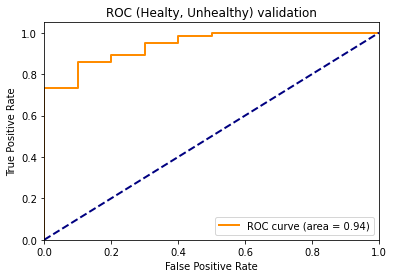

In [46]:
avg =[]
# total =  np.sum(losses*(losses > 0.16),axis = (1,2))
total = (total_all_test*(total_all_test > 5.5)).sum(axis = (1,2))
print(total.shape)
classes = idx_to_label.values()
normal_loss = total[np.where(y_test == 0)[0]]
normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
avg.append(np.ravel(normal_loss).tolist())

cnv_loss = total[np.where(y_test == 1)[0]]
cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
avg.append(np.ravel(cnv_loss).tolist())

dr_loss = total[np.where(y_test == 2)[0]]
dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
avg.append(np.ravel(dr_loss).tolist())

# amd_loss = total[np.where(y_valid == 3)[0]]
# amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
# avg.append(np.ravel(amd_loss).tolist())

plt.figure(figsize=(9, 7))
plt.boxplot(avg,labels=classes)
plt.xlabel("Classes")
plt.ylabel("Loss value")
plt.title("Loss per class-validation")
plt.show()

print(y_test.shape)
y_test_2 = np.where(y_test > 0, 1, 0)
fpr, tpr, thresholds = metrics.roc_curve(y_test_2, total)
roc_auc_all = metrics.auc(fpr, tpr)


plt.figure()
lw = 2
plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC (Healty, Unhealthy) validation")
plt.legend(loc="lower right")
plt.show()


In [47]:


def restore(model, n, img, threshold_log_p = 5.3):
    """ Generate n restorations of images
        Returns restorations, both images and codes """

    model.eval()
    #Use VQ-VAE to encode original image,
    codes = model.retrieve_codes(img)
    code_size = codes.shape[-2:]
    with torch.no_grad():
        loss_original = model.loss(img, reduction='none')['loss']
        loss_original = loss_original.cpu().numpy()
        samples = codes.clone().unsqueeze(1).repeat(1,n,1,1).reshape(img.unsqueeze(0).shape[0]*n,*code_size)
        # Iterate through latent variables. 
        for r in range(code_size[0]):
            for c in range(code_size[1]):

                logits = model.forward_latent(samples)[:, :, r, c]
                loss = F.cross_entropy(logits, samples[:, r, c], reduction='none')
                loss_original[:,r,c] = loss.cpu().numpy()

                # Replace sample if above threshold
                probs = F.softmax(logits, dim=1)
                samples[loss > threshold_log_p, r, c] = torch.multinomial(probs, 1).squeeze(-1)[loss > threshold_log_p]
                
        # upscale loss
        up_scl = 8
        upscale_loss = np.kron(loss_original, np.ones((up_scl,up_scl)))
        # remove values less than the threshold
        for u in range(upscale_loss.shape[1]):
            for j in range(upscale_loss.shape[2]):
                if np.any(upscale_loss[0][u][j] < threshold_log_p):
                    upscale_loss[0][u][j] = float('nan')

        # Retrieve z for the latent codes
        z = model.feature_extractor_model.codebook.embedding(samples.unsqueeze(1))
        z = z.squeeze(1).permute(0,3,1,2).contiguous()

        # Decode to pixel space splitting computation in batches\n,
        x_tilde = []
        for i in range(img.shape[0]):
            x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
        x_tilde = torch.cat(x_tilde)

        decoded_image = x_tilde.reshape(1,n,*img.shape[-2:])
        decoded_latent = samples.reshape(1,n,*code_size)
        
        
        return decoded_image, decoded_latent,upscale_loss,loss_original
    
    

In [48]:
my_whole_seed = 42
torch.manual_seed(my_whole_seed)
torch.cuda.manual_seed_all(my_whole_seed)
torch.cuda.manual_seed(my_whole_seed)
np.random.seed(my_whole_seed)
random.seed(my_whole_seed)

In [49]:
my_whole_seed = 42
torch.manual_seed(my_whole_seed)
torch.cuda.manual_seed_all(my_whole_seed)
torch.cuda.manual_seed(my_whole_seed)
np.random.seed(my_whole_seed)
random.seed(my_whole_seed)

drac_data =[]
drac_label = []
filenames = []
segmentations = []
ctlist=os.listdir('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_segmentation_merged_subset')
ctlist=natsort.natsorted(ctlist)
# read labels from the excel file
dfs = pd.read_csv('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/2. Groundtruths/a. DRAC2022_ Diabetic Retinopathy Grading_Training Labels.csv')

for idx, filename in enumerate(ctlist):
    x = dfs.loc[dfs['image name'] == filename]['DR grade'].values
    if(x[0] != None):
        
        image = imread('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_segmentation_merged_subset/'+filename)
        image_resize = cv.resize(image, (512, 512))
        seg = imread('/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_groundtruth_merged_subset/'+filename)
        seg_resize = cv.resize(seg, (512, 512))
        drac_data.append(image_resize)
        drac_label.append(x[0])
        filenames.append(filename)
        segmentations.append(seg_resize)
        

In [50]:
drac_data = np.asarray(drac_data)
drac_label = np.asarray(drac_label)
drac_segmentations = np.asarray(segmentations)
# drac_label[drac_label == 1] = 2

In [51]:
drac_data.shape

(7, 512, 512)

In [52]:
drac_dataset = anomalyDetectionB5(images=drac_data,labels = drac_label, transform=None)
drac_loader = torch.utils.data.DataLoader(drac_dataset, batch_size=1, shuffle=False, num_workers=4)

In [53]:
import cv2
class CubeDataset_plexilite(Dataset):
    def __init__(self, data_dir,data_size,is_dataaug=True):
        self.is_dataaug=is_dataaug
        # self.datanum=data_id[1]-data_id[0]
        # self.modality=modality
        self.data_size=data_size
        # self.modalitynum=len(modality)-1
        self.datasetlist={'data':{},'label':{}}
        # for modal in modality:
            # if modal != modality[-1]:
        # self.datasetlist['data'].update({modal: {}})
        imglist = os.listdir(data_dir)
        imglist = natsort.natsorted(imglist)
        self.datanum = len(imglist)
        for img in imglist:
            self.datasetlist['data'].update({img: {}})
            imgadress= os.path.join(data_dir, img)
            self.datasetlist['data'][img] = imgadress
            # else:
            #     imglist = os.listdir(os.path.join(data_dir, modal))
            #     imglist = natsort.natsorted(imglist)
            #     for img in imglist[data_id[0]:data_id[1]]:
            #         self.datasetlist['label'].update({img: {}})
            #         labeladdress = os.path.join(data_dir, modal, img)
            #         self.datasetlist['label'][img] = labeladdress

    def __getitem__(self, index):
        data=np.zeros((1,self.data_size[0],self.data_size[1]))
        # label = np.zeros((self.data_size[0],self.data_size[1]))
        # for i,modal in enumerate(self.modality):
        #     if modal != self.modality[-1]:
        name=list(self.datasetlist['data'])[index]
        single_img= cv2.imread(self.datasetlist['data'][name], cv2.IMREAD_GRAYSCALE).astype(np.float32)
        
        data[0,:,:] = cv2.resize(single_img/255, (512, 512))
        
            # else:
            #     name = list(self.datasetlist['label'])[index]
            #     label[:,:]=cv2.imread(self.datasetlist['label'][name], cv2.IMREAD_GRAYSCALE).astype(np.float32)

        # #data augmentation
        # if self.is_dataaug==True:
        #     data=self.augmentation(data)
        data = torch.from_numpy(np.ascontiguousarray(data))
        print(data.shape)
        # label = torch.from_numpy(np.ascontiguousarray(label))
        return data,name

    def __len__(self):
        return self.datanum

In [54]:
dataroot = '/home/hana/optima/exchange/hjebril/challenge/C. Diabetic Retinopathy Grading/1. Original Images/cropped_segmentation_merged_subset'
drac_test_dataset = CubeDataset_plexilite(dataroot, [512,512],is_dataaug=False)


# test_dataset = BatchDataReader.CubeDataset(opt.dataroot, opt.test_ids, opt.data_size, opt.modality_filename,is_dataaug=False)
drac_test_loader = torch.utils.data.DataLoader(drac_test_dataset, batch_size=1, shuffle=False, num_workers=1)


In [55]:
uncertaities_drac = evaluate_uncertainty(net,drac_loader,device, nb_forward=50)

100%|██████████| 7/7 [00:20<00:00,  2.95s/it]


In [56]:
uncertaities_drac.shape

(7, 512, 512)

In [65]:
my_whole_seed = 42
torch.manual_seed(my_whole_seed)
torch.cuda.manual_seed_all(my_whole_seed)
torch.cuda.manual_seed(my_whole_seed)
np.random.seed(my_whole_seed)
random.seed(my_whole_seed)

threshold_log_p 7.2128400802612305
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


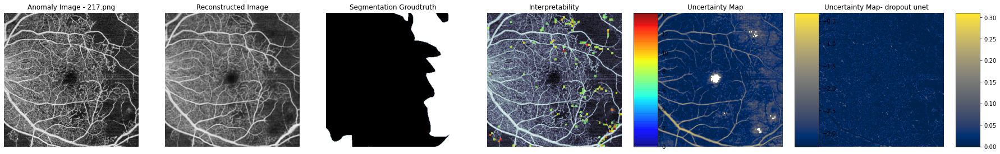

threshold_log_p 6.672815322875977
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


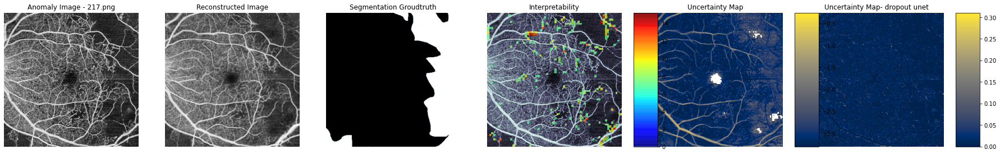

threshold_log_p 6.364498138427734
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


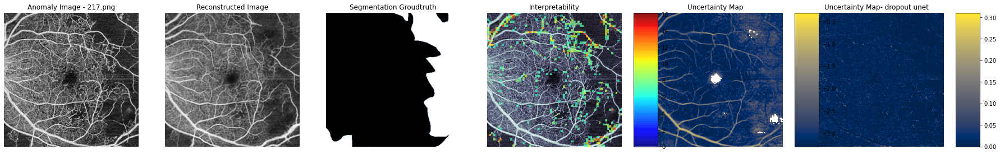

threshold_log_p 6.14257287979126
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


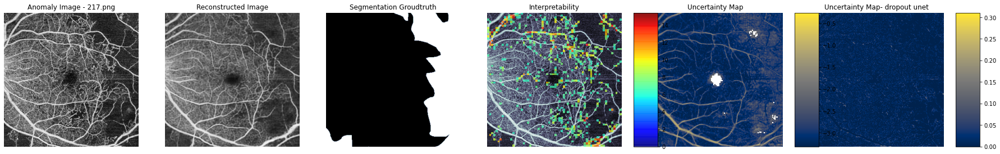

threshold_log_p 5.976009368896484
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


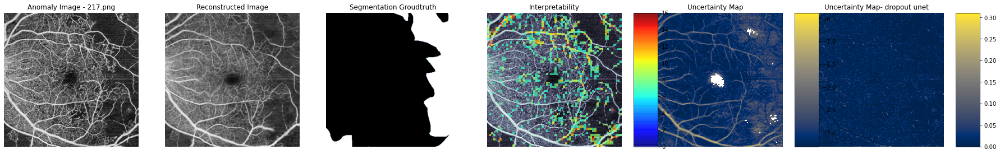

threshold_log_p 5.838268280029297
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


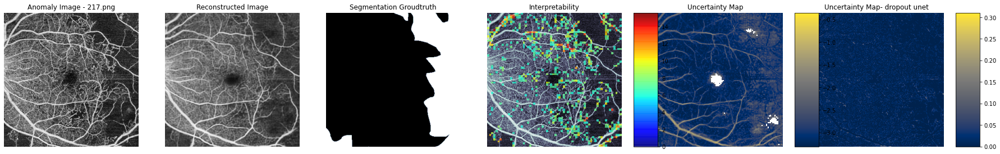

threshold_log_p 5.719380855560303
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


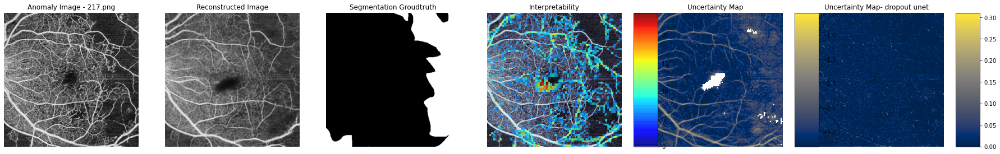

threshold_log_p 5.6188530921936035
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


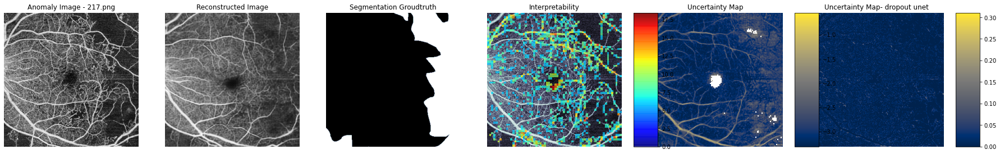

threshold_log_p 5.5279741287231445
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


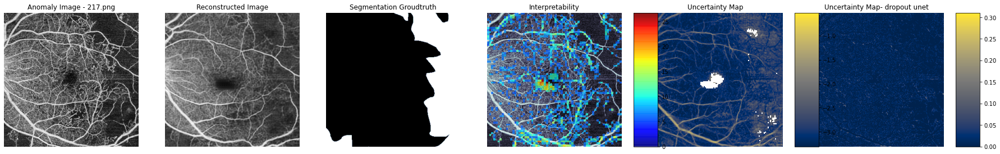

threshold_log_p 5.447995662689209
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


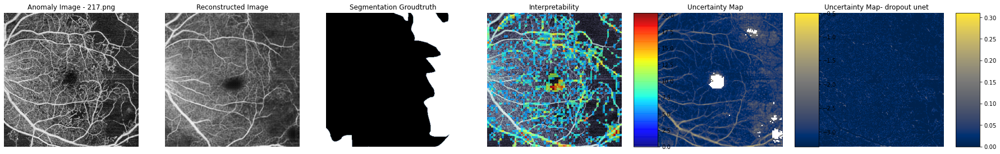

threshold_log_p 5.375791549682617
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


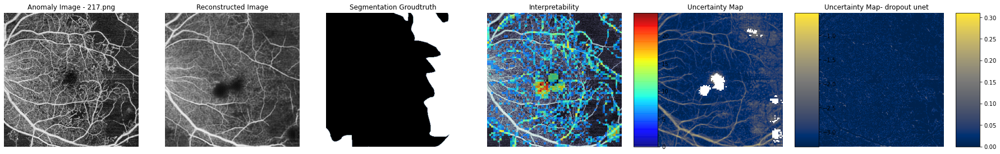

threshold_log_p 5.308166980743408
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


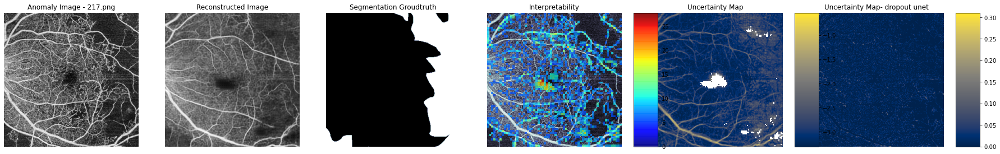

threshold_log_p 0
torch.Size([10, 64, 64])
torch.Size([10, 10, 64, 64])
1
torch.Size([1, 10, 512, 512])
torch.Size([1, 10, 64, 64])


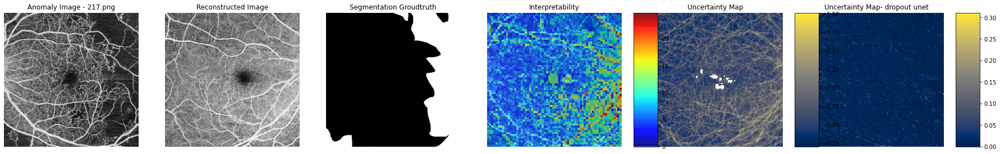

In [70]:
w = drac_data.copy()
yy=drac_label

threshold_log_p = 5.3
threshold_anomaly = 6
thresh_uncertain = 0.05
n=10
k = 10
# for img_sample in range(w.shape[0]):
for img_sample in range(1):
    for percentile in perces:
        threshold_log_p= percentile
        print('threshold_log_p', threshold_log_p)
        random.seed(42)
        torch.manual_seed(42)
        x = torch.from_numpy(w[img_sample+2].copy()).to("cuda").float()
        model.eval()
        #Use VQ-VAE to encode original image\n,
    #     uncertain = uncertaities_drac[img_sample]
    #     uncertain_resize = torch.from_numpy(np.resize(uncertain, (38, 38))).to(device)
        codes = model.retrieve_codes(x.unsqueeze(0)/255)
        code_size = codes.shape[-2:]
        with torch.no_grad():
            loss_original = model.loss(x.unsqueeze(0)/255, reduction='none')['loss']
            loss_original = loss_original.repeat(n,1,1).cpu().numpy()
    #         raster_loss_original = loss_original.unsqueeze(0).repeat(k,2,1,1)
    #         raster_loss_original = raster_loss_original.cpu().numpy()

            samples = codes.clone().unsqueeze(1).repeat(1,n,1,1).reshape(x.unsqueeze(0).shape[0]*n,*code_size)
            print(samples.shape)
            raster_samples = samples.unsqueeze(0).repeat(k,1,1,1)
            print(raster_samples.shape)
            # Iterate through latent variables. 
            ##### 1
            print('1')
            for r in range(code_size[0]):
                for c in range(code_size[1]):

                    logits = model.forward_latent(samples)[:, :, r, c]
                    loss = F.cross_entropy(logits, samples[:, r, c], reduction='none')
                    loss_original[:,r,c] = loss.cpu().numpy()
    #                 unvert_val = uncertain_resize[r,c]
                    # Replace sample if above threshold
                    probs = F.softmax(logits, dim=1)
                    samples[loss > threshold_log_p, r, c] = torch.multinomial(probs, 1).squeeze(-1)[loss > threshold_log_p]


        # upscale loss
            up_scl = 8
            # mean_loss = raster_loss_original.max(axis=0        # print(mean_loss[0].max())
            upscale_loss = np.kron(loss_original, np.ones((up_scl,up_scl)))
            # remove values less than the threshold
            for u in range(upscale_loss.shape[1]):
                for j in range(upscale_loss.shape[2]):
                    if(upscale_loss[0][u][j] < threshold_log_p):
                        upscale_loss[0][u][j] = float('nan')

            # mean_samples = torch.max(raster_samples, 0)
            # Retrieve z for the latent codes
            z = model.feature_extractor_model.codebook.embedding(samples)
            z = z.squeeze(1).permute(0,3,1,2).contiguous()

            # Decode to pixel space splitting computation in batches\n,
            x_tilde = []
            for i in range(w.shape[0]):
                x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
            x_tilde = torch.cat(x_tilde)

            decoded_image = x_tilde.reshape(1,n,*w.shape[-2:])
            decoded_latent = samples.reshape(1,n,*code_size)
            print(decoded_image.shape)
            print(decoded_latent.shape)

            fig, (ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(nrows=1, ncols=6, figsize=(30,5))
            im = ax1.imshow(w[img_sample+2],cmap='gray')
            ax1.title.set_text("Anomaly Image - " + filenames[img_sample+2])
            ax1.axis('off')
            # plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)


            im = ax2.imshow(decoded_image[0][0].cpu(),cmap='gray')
            ax2.title.set_text("Reconstructed Image")
            ax2.axis('off')
            # plt.colorbar(im, ax=[ax2], pad=0.01, shrink=0.50)

            ax3.imshow(drac_segmentations[img_sample+2],cmap='bone')
    #         im = ax3.imshow(upscale_loss[0],cmap='jet', interpolation='none', alpha=0.7,vmin=0, vmax=loss_original[0].max())
    #         cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,0.02,ax3.get_position().height])
    #         plt.colorbar(im, orientation="vertical", cax = cax)
            ax3.set_title('Segmentation Groudtruth')
            ax3.axis('off')


            ax4.imshow(w[img_sample+2],cmap='bone')
            im = ax4.imshow(upscale_loss[0],cmap='jet', interpolation='none', alpha=0.7,vmin=0, vmax=loss_original[0].max())
            cax = fig.add_axes([ax4.get_position().x1+0.01,ax4.get_position().y0,0.02,ax4.get_position().height])
            plt.colorbar(im, orientation="vertical", cax = cax)
            ax4.set_title('Interpretability')
            ax4.axis('off')



            batch_mean = decoded_image.float().mean(dim=1)
            batch_std = decoded_image.float().std(dim=1)
            batch_pred_entropy = -torch.sum(batch_mean*batch_mean.log(),dim=0)
            batch_mutual_info = batch_pred_entropy+torch.mean(torch.sum(decoded_image*decoded_image.log(),dim=-3),dim=0)

            im = ax5.imshow(batch_mutual_info.cpu().detach().numpy(),cmap='cividis')
            cax = fig.add_axes([ax5.get_position().x1+0.01,ax5.get_position().y0,0.02,ax5.get_position().height])
            plt.colorbar(im, orientation="vertical", cax = cax)
            ax5.title.set_text("Uncertainty Map")
            ax5.axis('off')
            # plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)

            both_uncertain = uncertaities_drac[img_sample+2]
            im = ax6.imshow(both_uncertain,cmap='cividis')
            cax = fig.add_axes([ax6.get_position().x1+0.01,ax6.get_position().y0,0.02,ax6.get_position().height])
            plt.colorbar(im, orientation="vertical", cax = cax)
            ax6.title.set_text("Uncertainty Map- dropout unet")
            ax6.axis('off')




            plt.show()

            #         return raster_loss_original,raster_samples


In [64]:
decoded_image.shape

torch.Size([1, 10, 512, 512])

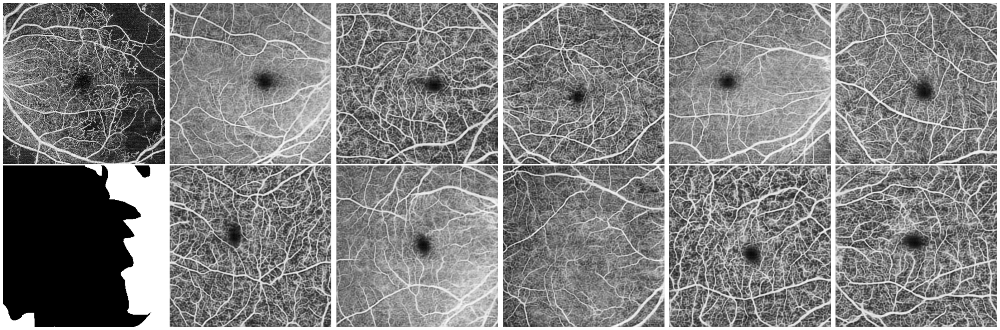

In [71]:
img_no = 2
slice_no = 9
img_sample = 3
fig, ax = plt.subplots(2,6, figsize=(30,10))
ax[0,0].imshow(w[img_no],cmap='gray')
ax[0,0].axis('off')
ax[1,0].imshow(drac_segmentations[img_no],cmap='gray')
ax[1,0].axis('off')

for i in range(1,6):
    ax[0,i].imshow(decoded_image[img_no-2][i-1].cpu(),cmap='gray')
    ax[0,i].axis('off')

for i in range(1,6):
    ax[1,i].imshow(decoded_image[img_no-2][i-1+5].cpu(),cmap='gray')
    ax[1,i].axis('off')
plt.tight_layout()

In [ ]:
w = drac_data.copy()
yy=drac_label

threshold_log_p = 5
threshold_anomaly = 6
thresh_uncertain = 0.002
n=10
k = 8
for img_sample in range(w.shape[0]):
# for img_sample in range(1):
    random.seed(42)
    torch.manual_seed(42)
    x = torch.from_numpy(w[img_sample].copy()).to("cuda").float()
    model.eval()
    #Use VQ-VAE to encode original image\n,
#     uncertain = uncertaities_drac[img_sample]
#     uncertain_resize = torch.from_numpy(np.resize(uncertain, (38, 38))).to(device)
    codes = model.retrieve_codes(x.unsqueeze(0)/255)
    code_size = codes.shape[-2:]
    with torch.no_grad():
        loss_original = model.loss(x.unsqueeze(0)/255, reduction='none')['loss']
        loss_original = loss_original.repeat(n,1,1).cpu().numpy()
#         raster_loss_original = loss_original.unsqueeze(0).repeat(k,2,1,1)
#         raster_loss_original = raster_loss_original.cpu().numpy()
        
        samples = codes.clone().unsqueeze(1).repeat(1,n,1,1).reshape(x.unsqueeze(0).shape[0]*n,*code_size)
        print(samples.shape)
        raster_samples = samples.unsqueeze(0).repeat(k,1,1,1)
        print(raster_samples.shape)
        # Iterate through latent variables. 
        ##### 1
        print('1')
        for r in range(code_size[0]):
            for c in range(code_size[1]):
                
                logits = model.forward_latent(samples)[:, :, r, c]
                loss = F.cross_entropy(logits, samples[:, r, c], reduction='none')
                loss_original[:,r,c] = loss.cpu().numpy()
#                 unvert_val = uncertain_resize[r,c]
                # Replace sample if above threshold
                probs = F.softmax(logits, dim=1)
                samples[loss > threshold_log_p, r, c] = torch.multinomial(probs, 1).squeeze(-1)[loss > threshold_log_p]

    
    # upscale loss
        up_scl = 8
        # mean_loss = raster_loss_original.max(axis=0)
        # print(mean_loss[0].max())
        upscale_loss = np.kron(loss_original, np.ones((up_scl,up_scl)))
        # remove values less than the threshold
        for u in range(upscale_loss.shape[1]):
            for j in range(upscale_loss.shape[2]):
                if(upscale_loss[0][u][j] < threshold_log_p):
                    upscale_loss[0][u][j] = float('nan')

        # mean_samples = torch.max(raster_samples, 0)
        # Retrieve z for the latent codes
        z = model.feature_extractor_model.codebook.embedding(samples)
        z = z.squeeze(1).permute(0,3,1,2).contiguous()

        # Decode to pixel space splitting computation in batches\n,
        x_tilde = []
        for i in range(w.shape[0]):
            x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
        x_tilde = torch.cat(x_tilde)

        decoded_image = x_tilde.reshape(1,n,*w.shape[-2:])
        decoded_latent = samples.reshape(1,n,*code_size)
        print(decoded_image.shape)
        print(decoded_latent.shape)

        fig, (ax1,ax2,ax3,ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5))
        im = ax1.imshow(w[img_sample],cmap='gray')
        ax1.title.set_text("Anomaly Image - " + filenames[img_sample])
        ax1.axis('off')
        # plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)


        im = ax2.imshow(decoded_image[0][0].cpu(),cmap='gray')
        ax2.title.set_text("Reconstructed Image")
        ax2.axis('off')
        # plt.colorbar(im, ax=[ax2], pad=0.01, shrink=0.50)

        ax3.imshow(w[img_sample],cmap='bone')
        im = ax3.imshow(upscale_loss[0],cmap='jet', interpolation='none', alpha=0.7,vmin=0, vmax=loss_original[0].max())
        cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,0.02,ax3.get_position().height])
        plt.colorbar(im, orientation="vertical", cax = cax)
        ax3.set_title('Interpretability')
        ax3.axis('off')
        
        
        
        batch_mean = decoded_image.float().mean(dim=1)
        batch_std = decoded_image.float().std(dim=1)
        batch_pred_entropy = -torch.sum(batch_mean*batch_mean.log(),dim=0)
        batch_mutual_info = batch_pred_entropy+torch.mean(torch.sum(decoded_image*decoded_image.log(),dim=-3),dim=0)
        both_uncertain = uncertaities_drac[img_sample]+batch_mutual_info.cpu().detach().numpy()
        im = ax4.imshow(both_uncertain,cmap='cividis')
        cax = fig.add_axes([ax4.get_position().x1+0.01,ax4.get_position().y0,0.02,ax4.get_position().height])
        plt.colorbar(im, orientation="vertical", cax = cax)
        ax4.title.set_text("Summation Uncertainty Map")
        ax4.axis('off')
        # plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)
        
        plt.show()

        #         return raster_loss_original,raster_samples


In [ ]:
samples.shape

In [ ]:
batch_mutual_info.shape

In [ ]:
batch_mutual_info.max()

In [ ]:
plt.imshow(batch_mutual_info.cpu().detach().numpy(),cmap='cividis')
plt.colorbar()

In [ ]:
w = X_test.copy()
yy=drac_label
uncertainties = []
threshold_log_p = 5
threshold_anomaly = 6
thresh_uncertain = 0.002
n=10
k = 8
for img_sample in range(w.shape[0]):
# for img_sample in range(1):
    random.seed(42)
    torch.manual_seed(42)
    x = torch.from_numpy(w[img_sample].copy()).to("cuda").float()
    model.eval()
    #Use VQ-VAE to encode original image\n,
#     uncertain = uncertaities_drac[img_sample]
#     uncertain_resize = torch.from_numpy(np.resize(uncertain, (38, 38))).to(device)
    codes = model.retrieve_codes(x.unsqueeze(0)/255)
    code_size = codes.shape[-2:]
    with torch.no_grad():
        loss_original = model.loss(x.unsqueeze(0)/255, reduction='none')['loss']
        loss_original = loss_original.repeat(n,1,1).cpu().numpy()
#         raster_loss_original = loss_original.unsqueeze(0).repeat(k,2,1,1)
#         raster_loss_original = raster_loss_original.cpu().numpy()

        samples = codes.clone().unsqueeze(1).repeat(1,n,1,1).reshape(x.unsqueeze(0).shape[0]*n,*code_size)
        raster_samples = samples.unsqueeze(0).repeat(k,1,1,1)
        # Iterate through latent variables. 
        ##### 1
        print('1')
        for r in range(code_size[0]):
            for c in range(code_size[1]):
                
                logits = model.forward_latent(samples)[:, :, r, c]
                loss = F.cross_entropy(logits, samples[:, r, c], reduction='none')
                loss_original[:,r,c] = loss.cpu().numpy()
#                 unvert_val = uncertain_resize[r,c]
                # Replace sample if above threshold
                probs = F.softmax(logits, dim=1)
                samples[loss > threshold_log_p, r, c] = torch.multinomial(probs, 1).squeeze(-1)[loss > threshold_log_p]
        
    
#     # upscale loss
#         up_scl = 8
#         # mean_loss = raster_loss_original.max(axis=0)
#         # print(mean_loss[0].max())
#         upscale_loss = np.kron(loss_original, np.ones((up_scl,up_scl)))
#         # remove values less than the threshold
#         for u in range(upscale_loss.shape[1]):
#             for j in range(upscale_loss.shape[2]):
#                 if(upscale_loss[0][u][j] < threshold_log_p):
#                     upscale_loss[0][u][j] = float('nan')

        # mean_samples = torch.max(raster_samples, 0)
        # Retrieve z for the latent codes
        z = model.feature_extractor_model.codebook.embedding(samples)
        z = z.squeeze(1).permute(0,3,1,2).contiguous()

        # Decode to pixel space splitting computation in batches\n,
        x_tilde = []
        for i in range(w.shape[0]):
            x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
        x_tilde = torch.cat(x_tilde)

        decoded_image = x_tilde.reshape(1,n,*w.shape[-2:])
        decoded_latent = samples.reshape(1,n,*code_size)
        print(decoded_image.shape)
        print(decoded_latent.shape)
        
        # compute uncertainty
        batch_mean = decoded_image.float().mean(dim=1)
        batch_std = decoded_image.float().std(dim=1)
        batch_pred_entropy = -torch.sum(batch_mean*batch_mean.log(),dim=0)
        batch_mutual_info = batch_pred_entropy+torch.mean(torch.sum(decoded_image*decoded_image.log(),dim=-3),dim=0)
        
        uncertainties.append(batch_mutual_info.cpu().numpy())

vqvae_uncertain_np = np.array(uncertainties)

In [ ]:
# 
# vqvae_uncertain_np = np.array(uncertainties.cpu().numpy())
uncer2 = []
for i in uncertainties:
    x = i.cpu().numpy()
    uncer2.append(x)
vqvae_uncertain_np = np.array(uncer2)

In [ ]:
vqvae_uncertain_np.max()

In [ ]:
perces3 = []
perces3.append(np.percentile(vqvae_uncertain_np, 99.5))
perces3.append(np.percentile(vqvae_uncertain_np, 99))
perces3.append(np.percentile(vqvae_uncertain_np, 98))
perces3.append(np.percentile(vqvae_uncertain_np, 97))

In [ ]:
perces3

In [ ]:
#  np.save ('vqvae_uncertain_test.npy', vqvae_uncertain_np) 
vqvae_uncertain_np = np.load('vqvae_uncertain_valid.npy')

In [ ]:
total_all = (vqvae_uncertain_np)

In [ ]:
avg =[]
# total =  np.sum(losses*(losses > 0.16),axis = (1,2))
total = (total_all*(total_all > -1)).sum(axis = (1,2))
print(total.shape)
classes = idx_to_label.values()
normal_loss = total[np.where(y_valid == 0)[0]]
normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
avg.append(np.ravel(normal_loss).tolist())

cnv_loss = total[np.where(y_valid == 1)[0]]
cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
avg.append(np.ravel(cnv_loss).tolist())

dr_loss = total[np.where(y_valid == 2)[0]]
dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
avg.append(np.ravel(dr_loss).tolist())

amd_loss = total[np.where(y_valid == 3)[0]]
amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
avg.append(np.ravel(amd_loss).tolist())

plt.figure(figsize=(9, 7))
plt.boxplot(avg,labels=classes)
plt.xlabel("Classes")
plt.ylabel("Loss value")
plt.title("Loss per class-validation")
plt.show()

print(y_valid.shape)
y_test_2 = np.where(y_valid > 0, 1, 0)
fpr, tpr, thresholds = metrics.roc_curve(y_test_2, total)
roc_auc_all = metrics.auc(fpr, tpr)


plt.figure()
lw = 2
plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC (Healty, Unhealthy) validation")
plt.legend(loc="lower right")
plt.show()


In [ ]:
vqvae_uncertain_np = np.load('vqvae_uncertain_test.npy')

In [ ]:
vqvae_uncertain_np = np.nan_to_num(vqvae_uncertain_np, copy=True, nan=-2, posinf=None, neginf=None)

In [ ]:
total_all = ( vqvae_uncertain_np)

In [ ]:
avg =[]
# total =  np.sum(losses*(losses > 0.16),axis = (1,2))
total = (total_all*(total_all > -2)).sum(axis = (1,2))
print(total.shape)
classes = idx_to_label.values()
normal_loss = total[np.where(y_test == 0)[0]]
normal_loss_avg = np.sum(normal_loss)/normal_loss.shape[0]
avg.append(np.ravel(normal_loss).tolist())

cnv_loss = total[np.where(y_test == 1)[0]]
cnv_loss_avg = np.sum(cnv_loss)/cnv_loss.shape[0]
avg.append(np.ravel(cnv_loss).tolist())

dr_loss = total[np.where(y_test == 2)[0]]
dr_loss_avg = np.sum(dr_loss)/dr_loss.shape[0]
avg.append(np.ravel(dr_loss).tolist())

amd_loss = total[np.where(y_test == 3)[0]]
amd_loss_avg = np.sum(amd_loss)/amd_loss.shape[0]
avg.append(np.ravel(amd_loss).tolist())

plt.figure(figsize=(9, 7))
plt.boxplot(avg,labels=classes)
plt.xlabel("Classes")
plt.ylabel("Loss value")
plt.title("Loss per class-validation")
plt.show()

print(y_test.shape)
y_test_2 = np.where(y_test > 0, 1, 0)
fpr, tpr, thresholds = metrics.roc_curve(y_test_2, total)
roc_auc_all = metrics.auc(fpr, tpr)


plt.figure()
lw = 2
plt.plot(fpr,tpr,color="darkorange",lw=lw,label="ROC curve (area = %0.2f)" % roc_auc_all,)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC (Healty, Unhealthy) validation")
plt.legend(loc="lower right")
plt.show()


In [ ]:
up_scl = 8
mean_loss = raster_loss_original.max(axis=0)
print(mean_loss[0].max())
upscale_loss = np.kron(mean_loss, np.ones((up_scl,up_scl)))
# remove values less than the threshold
for u in range(upscale_loss.shape[1]):
    for j in range(upscale_loss.shape[2]):
        if(upscale_loss[0][u][j] < threshold_log_p):
            upscale_loss[0][u][j] = float('nan')

print(upscale_loss[0])            
mean_samples = torch.max(raster_samples, 0)
print(raster_samples.shape)
print(mean_samples.values.shape)
# Retrieve z for the latent codes
z = model.feature_extractor_model.codebook.embedding(mean_samples.values.unsqueeze(1))
z = z.squeeze(1).permute(0,3,1,2).contiguous()

# Decode to pixel space splitting computation in batches\n,
x_tilde = []
for i in range(w.shape[0]):
    x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
x_tilde = torch.cat(x_tilde)

decoded_image = x_tilde.reshape(1,n,*w.shape[-2:])
decoded_latent = samples.reshape(1,n,*code_size)


fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20,20))
im = ax1.imshow(w[img_sample],cmap='gray')
ax1.title.set_text("Anomaly Image - " + filenames[img_sample])
ax1.axis('off')
# plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)


im = ax2.imshow(decoded_image[0][0].cpu(),cmap='gray')
ax2.title.set_text("Reconstructed Image")
ax2.axis('off')
# plt.colorbar(im, ax=[ax2], pad=0.01, shrink=0.50)

ax3.imshow(w[img_sample],cmap='bone')
im = ax3.imshow(upscale_loss[0],cmap='jet', interpolation='none', alpha=0.7,vmin=0, vmax=mean_loss[0].max())
cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,0.02,ax3.get_position().height])
plt.colorbar(im, orientation="vertical", cax = cax)
ax3.set_title('Interpretability')
ax3.axis('off')
plt.show()

#         return raster_loss_original,raster_samples


In [ ]:
plt.imshow(mean_loss[0])
plt.colorbar()

In [ ]:
mean_loss.shape

In [ ]:
# Retrieve z for the latent codes
z = model.feature_extractor_model.codebook.embedding(raster_samples[7].unsqueeze(1))
z = z.squeeze(1).permute(0,3,1,2).contiguous()

# Decode to pixel space splitting computation in batches\n,
x_tilde = []
for i in range(w.shape[0]):
    x_tilde.append(model.feature_extractor_model.decode(z[i*n:(i+1)*n]))
x_tilde = torch.cat(x_tilde)

decoded_image = x_tilde.reshape(1,n,*w.shape[-2:])
decoded_latent = samples.reshape(1,n,*code_size)


fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20,20))
im = ax1.imshow(w[img_sample],cmap='gray')
ax1.title.set_text("Anomaly Image - " + filenames[img_sample])
ax1.axis('off')
# plt.colorbar(im, ax=[ax1], pad=0.01, shrink=0.50)


im = ax2.imshow(decoded_image[0][0].cpu(),cmap='gray')
ax2.title.set_text("Reconstructed Image")
ax2.axis('off')
# plt.colorbar(im, ax=[ax2], pad=0.01, shrink=0.50)

ax3.imshow(w[img_sample],cmap='bone')
im = ax3.imshow(upscale_loss[0],cmap='jet', interpolation='none', alpha=0.7,vmin=0, vmax=loss_original[0].max())
cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,0.02,ax3.get_position().height])
plt.colorbar(im, orientation="vertical", cax = cax)
ax3.set_title('Interpretability')
ax3.axis('off')
plt.show()

#         return raster_loss_original,raster_samples


In [ ]:
codes.shape

In [ ]:
|

In [ ]:
\\

In [ ]:
||